In [12]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import reverse_geocoder as rg
%matplotlib inline

# Color Pallete

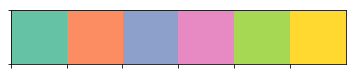

In [2]:
current_palette_1 = sns.color_palette("Set2", 6)
sns.set_palette(current_palette_1)
sns.palplot(current_palette_1)

# Cleaning the Dataset

In [3]:
df = pd.read_csv('scrubbed.csv',delimiter=',',sep='delimiter',low_memory=False)
# df = pd.read_csv('complete.csv',skiprows=2)
df

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude
0,10/10/1949 20:30,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 194...,4/27/2004,29.8830556,-97.941111
1,10/10/1949 21:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.38421,-98.581082
2,10/10/1955 17:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.2,-2.916667
3,10/10/1956 21:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.9783333,-96.645833
4,10/10/1960 20:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.4180556,-157.803611
5,10/10/1961 19:00,bristol,tn,us,sphere,300,5 minutes,My father is now 89 my brother 52 the girl wit...,4/27/2007,36.5950000,-82.188889
6,10/10/1965 21:00,penarth (uk/wales),NaN,gb,circle,180,about 3 mins,penarth uk circle 3mins stayed 30ft above m...,2/14/2006,51.434722,-3.180000
7,10/10/1965 23:45,norwalk,ct,us,disk,1200,20 minutes,A bright orange color changing to reddish colo...,10/2/1999,41.1175000,-73.408333
8,10/10/1966 20:00,pell city,al,us,disk,180,3 minutes,Strobe Lighted disk shape object observed clos...,3/19/2009,33.5861111,-86.286111
9,10/10/1966 21:00,live oak,fl,us,disk,120,several minutes,Saucer zaps energy from powerline as my pregna...,5/11/2005,30.2947222,-82.984167


In [4]:
#missing data summary
missingData = df.apply(lambda x: x.isnull().sum(), axis=0)
missingData

datetime                   0
city                       0
state                   5797
country                 9670
shape                   1932
duration (seconds)         0
duration (hours/min)       0
comments                  15
date posted                0
latitude                   0
longitude                  0
dtype: int64

In [5]:
df["country"].value_counts()

us    65114
ca     3000
gb     1905
au      538
de      105
Name: country, dtype: int64

In [6]:
df.loc[df['latitude']=='33q.200088'] = '33.200088'

In [7]:
df['latitude'] = df['latitude'].astype('float64')
df['longitude '] = df['longitude '].astype('float64')

In [8]:
# df['dummy'] = df.loc[df['country'].isnull()].apply(lambda row: rg.search((row['latitude'],row['longitude ']))[0]["cc"],axis=1)

In [9]:
co_ordinates = []

In [10]:
for i in range(0,len(df['country'])):
    co_ordinates.append((df['latitude'][i],df['longitude '][i])) 

print (co_ordinates)

[(29.883055599999999, -97.941111099999986), (29.384209999999999, -98.581081999999995), (53.200000000000003, -2.9166669999999999), (28.978333299999999, -96.645833299999993), (21.418055599999999, -157.80361110000001), (36.594999999999999, -82.188888900000009), (51.434722000000001, -3.1800000000000002), (41.1175, -73.408333299999995), (33.586111099999997, -86.286111099999985), (30.294722199999999, -82.984166700000003), (33.916388900000001, -118.35166670000001), (35.233333299999998, -82.734444400000001), (40.6686111, -73.527500000000003), (37.153611099999999, -83.761944400000004), (35.8238889, -80.253611099999986), (36.8430556, -83.321944400000007), (42.537777800000001, -83.2330556), (41.325277800000002, -72.193611099999998), (32.364167000000002, -64.678611000000004), (42.391666700000002, -71.566666699999999), (51.5, -3.2000000000000002), (38.105555600000002, -98.659722200000004), (32.854444399999998, -79.974999999999994), (45.582777800000002, -122.3522222), (51.783332999999999, -0.7833329

In [14]:
results = rg.search(co_ordinates)
print(results)

Loading formatted geocoded file...
[OrderedDict([('lat', '29.88327'), ('lon', '-97.94139'), ('name', 'San Marcos'), ('admin1', 'Texas'), ('admin2', 'Hays County'), ('cc', 'US')]), OrderedDict([('lat', '29.38663'), ('lon', '-98.61797'), ('name', 'Lackland Air Force Base'), ('admin1', 'Texas'), ('admin2', 'Bexar County'), ('cc', 'US')]), OrderedDict([('lat', '53.20832'), ('lon', '-2.9253'), ('name', 'Blacon'), ('admin1', 'England'), ('admin2', 'Cheshire West and Chester'), ('cc', 'GB')]), OrderedDict([('lat', '28.97859'), ('lon', '-96.64609'), ('name', 'Edna'), ('admin1', 'Texas'), ('admin2', 'Jackson County'), ('cc', 'US')]), OrderedDict([('lat', '21.40929'), ('lon', '-157.80092'), ('name', "Kane'ohe"), ('admin1', 'Hawaii'), ('admin2', 'Honolulu County'), ('cc', 'US')]), OrderedDict([('lat', '36.59511'), ('lon', '-82.18874'), ('name', 'Bristol'), ('admin1', 'Tennessee'), ('admin2', 'Sullivan County'), ('cc', 'US')]), OrderedDict([('lat', '51.4386'), ('lon', '-3.17342'), ('name', 'Penart

In [17]:
missing_count_coord = []

In [21]:
for i in range(0,len(df['country'])):
    if pd.isnull(df['country'][i]):
        missing_count_coord.append((df['latitude'][i],df['longitude '][i])) 

print (missing_count_coord)

[(29.384209999999999, -98.581081999999995), (32.364167000000002, -64.678611000000004), (53.970571, -111.689885), (-38.662334000000001, 178.01764900000001), (41.523426999999998, -73.646794999999997), (36.722262999999998, -86.577218000000002), (55.183332999999998, 59.649999999999999), (26.149798000000001, -97.913611000000003), (-33.093373, 151.58898200000002), (40.935997999999998, -73.901707999999999), (27.150053, -82.480653000000004), (43.405549999999998, -88.705104000000006), (38.627003000000002, -90.199404000000001), (41.793930000000003, -86.743915000000001), (53.070884, -2.7365060000000003), (40.058323999999999, -74.405660999999995), (55.288131, 23.957727999999999), (42.209774000000003, -79.466843999999995), (35.201050000000002, -91.831832999999989), (26.705621000000001, -80.03643000000001), (59.900208999999997, 5.2823469999999997), (40.516976999999997, -80.221347999999992), (37.615223, -122.389979), (42.468164000000002, -71.014118000000011), (35.947474, -86.488367000000011), (37.615

In [34]:
country = []
state = []
city = []

In [35]:
for i in range(0,len(results))

SyntaxError: invalid syntax (<ipython-input-35-761d5b0388e7>, line 1)

In [36]:
country = ['bello','hekko','mello','fdfaf','dfadasfa']

In [40]:
df.loc[df[country].isnull(), 'country'] = country

KeyError: "['bello' 'hekko' 'mello' 'fdfaf' 'dfadasfa'] not in index"